model agnostic

In [1]:
# !pip install pip install -U pyartemis

In [2]:
from util_comp import *
from scipy.cluster.hierarchy import dendrogram , linkage , fcluster
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from artemis.interactions_methods.model_agnostic import FriedmanHStatisticMethod
from time import time

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import random
import warnings

warnings.filterwarnings("ignore")

In [3]:
data = main(one_hot=True)

Elapsed time to compute data loading: 0 minutes and 0 seconds
Elapsed time to compute data cleaning: 0 minutes and 6 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE imputation: 0 minutes and 0 seconds
Elapsed time to compute MICE i

In [4]:
# Splitting the data into X and y
X = data.drop('outcome',axis=1)
X.columns = [str(col) for col in X.columns]
y = data['outcome']

In [5]:
# RF model
rf = RandomForestClassifier()

rf.fit(X, y)

RandomForestClassifier()

Fedmans H Statistics

In [6]:
# Get random selection of 100 observations

random.seed(42)
X_exp = random.choices(X.to_numpy(), k=100)
X_exp = pd.DataFrame(X_exp, columns=X.columns)

In [7]:
h_stat = FriedmanHStatisticMethod()
t1 = time()
h_stat.fit(rf, X_exp)
t2 = time()
print(time_e(t1, t2, 'Friedman H Statistic'))

Elapsed time to compute Friedman H Statistic: 34 minutes and 1 seconds


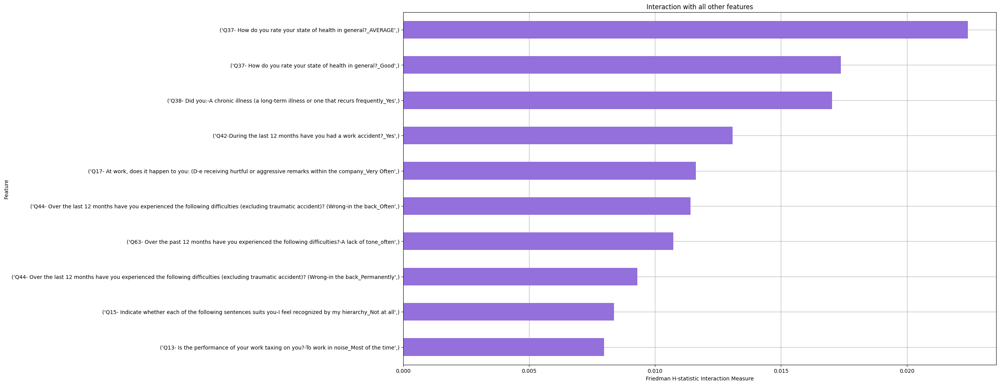

In [8]:
# Overall interactions
# fig, ax = plt.subplots(figsize=(20, 12))
h_stat.plot(vis_type='bar_chart_ova') # (, ax=ax)

# save the plot
plt.savefig('outputs/05_hStat/hStat_OverAll.png')

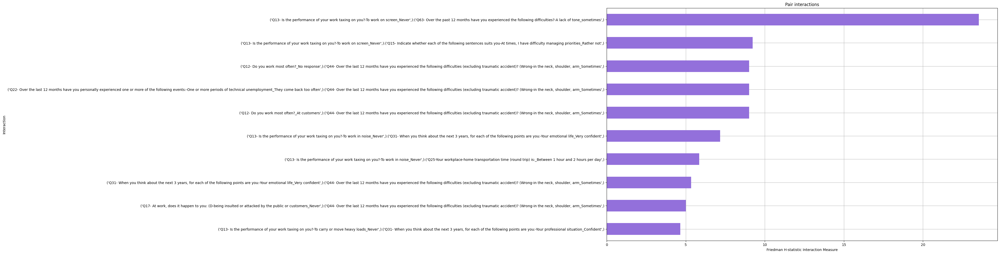

In [9]:
# Pairwise interactions
# fig, ax = plt.subplots(figsize=(20, 12))
h_stat.plot(vis_type='bar_chart') # (, ax=ax)

# save the plot
plt.savefig('outputs/05_hStat/hStat_Pairwise.png')

In [10]:
# Interaction heatmap
h_stat.plot(figsize=(100, 60))

# save the plot
plt.savefig('outputs/05_hStat/hStat_Heatmap_normalised.png')

Unnormalised H-Statistic

In [11]:
h_stat_unnormalised = FriedmanHStatisticMethod(normalized=False)
t1 = time()
h_stat_unnormalised.fit(rf, X_exp)
t2 = time()
print(time_e(t1, t2, 'Friedman H Statistic unnormalised'))

Elapsed time to compute Friedman H Statistic unnormalised: 34 minutes and 24 seconds


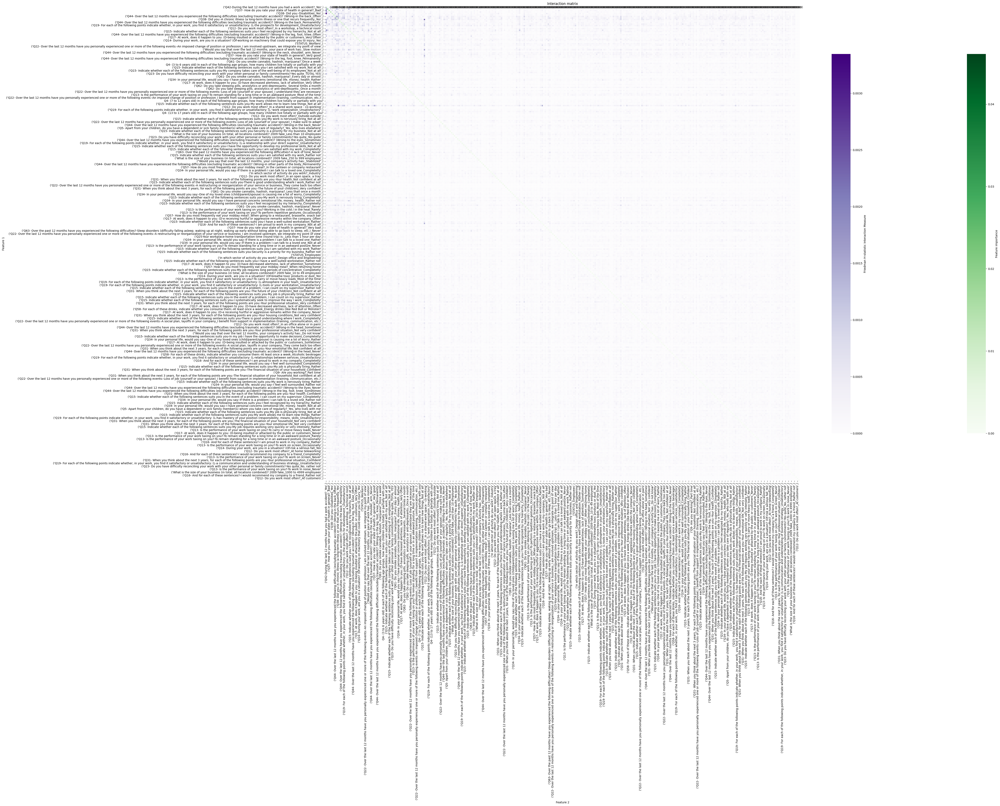

In [12]:
# Plot heatmap
fig, ax = plt.subplots(figsize=(50, 30))
h_stat_unnormalised.plot(ax=ax)

# save the plot
fig.savefig('outputs/05_hStat/hStat_heatmap_unnormalised.png')

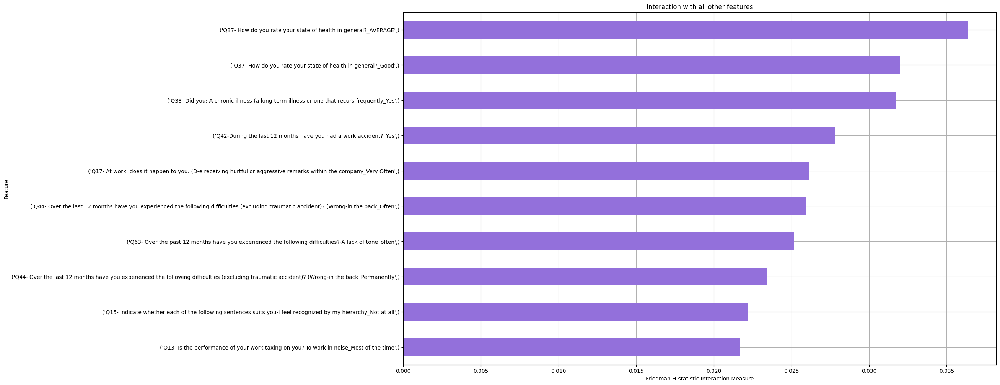

In [13]:
# Plot overall interactions
fig, ax = plt.subplots(figsize=(20, 12))
h_stat_unnormalised.plot(vis_type='bar_chart_ova', ax=ax)

# save the plot
plt.savefig('outputs/05_hStat/overall_interactions_unnormalised.png')

In [14]:
X_exp.columns

Index(['Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?',
       'Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you?',
       'Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you?',
       'Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you?',
       '('Q1- Your sex?_A woman',)',
       '('Q2- How old are you?_30 to 39 years old',)',
       '('Q2- How old are you?_40 to 44 years old',)',
       '('Q2- How old are you?_45 to 49 years old',)',
       '('Q2- How old are you?_50 to 55 years old',)',
       '('Q2- How old are you?_56 years and over',)',
       ...
       '('Q62- Do you take sleeping pills, anxiolytics or anti-depressants:_Once a month',)',
       '('Q62- Do you take sleeping pills, anxiolytics or anti-depressants:_Several 

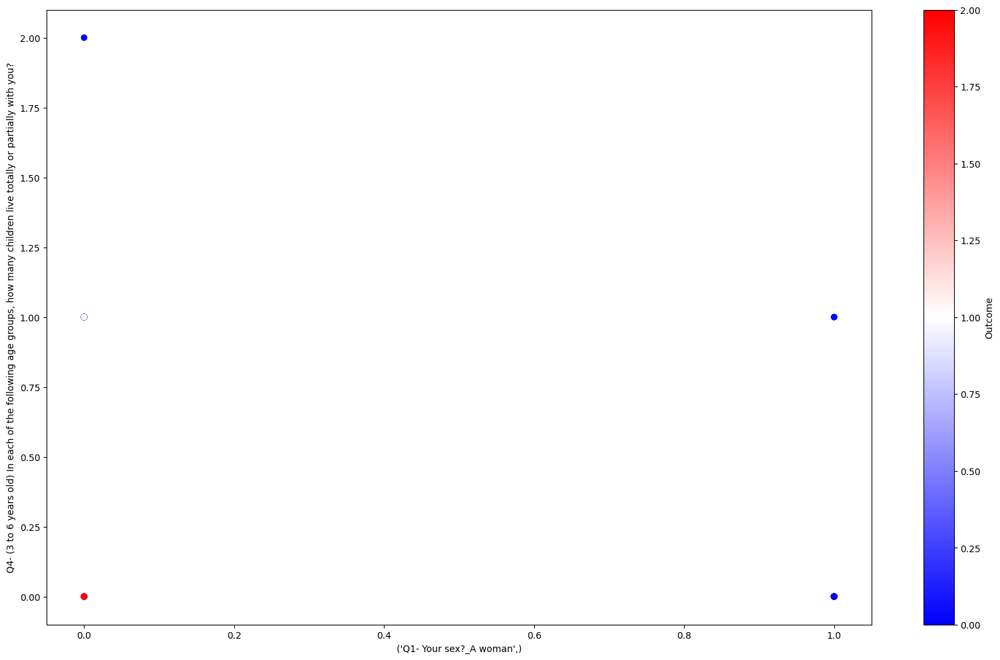

In [15]:
# Interaction between two features
fig, ax = plt.subplots(figsize=(20, 12))
plt.scatter(X_exp["('Q1- Your sex?_A woman',)"], X_exp["Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?"], c=y[:100], cmap='bwr')
plt.colorbar(label='Outcome', orientation='vertical')
plt.xlabel("('Q1- Your sex?_A woman',)")
plt.ylabel("Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?")
plt.savefig('outputs/05_hStat/interaction_between_two_features.png')